In [1]:
import sys
from pathlib import Path

# Trouve le dossier racine du projet (celui qui contient le dossier "heston")
current_dir = Path().resolve()
project_root = current_dir.parent if (current_dir / '..' / 'Functions').exists() else current_dir.parent.parent
# Ajoute au sys.path si nécessaire
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))
# Vérifie que le package est bien trouvé
try:
    import Functions
    print(f" Package 'Functions' trouvé à : {Functions.__file__}")
except ImportError:
    print("ERREUR : Impossible d'importer le package 'Functions'. Vérifie le chemin ou la structure du projet.")


 Package 'Functions' trouvé à : C:\Users\hello\Documents\GitHub\Implicit-Regularization-in-Matrix-Factorization-for-Financial-Portfolio-Construction\Functions\__init__.py


In [2]:
import pandas as pd
import numpy  as np
import matplotlib.pyplot as plt
import plotly.express    as px
import plotly.io         as pio

from sklearn.cluster       import KMeans
from sklearn.metrics       import silhouette_score
from sklearn.decomposition import PCA


from Functions.loader import MarketData

In [3]:
tickers = [
    # Technologie
    "AAPL",  # Apple
    "MSFT",  # Microsoft
    "GOOGL", # Alphabet (Google)
    "AMZN",  # Amazon
    "TSLA",  # Tesla
    "META",  # Meta Platforms (Facebook)
    "NVDA",  # Nvidia
    "ADBE",  # Adobe
    "ORCL",  # Oracle
    "CSCO",  # Cisco Systems
    "IBM",   # IBM
    "CRM",   # Salesforce
    "AMD",   # Advanced Micro Devices
    "QCOM",  # Qualcomm
    "AVGO",  # Broadcom
    "INTC",  # Intel
    "TXN",   # Texas Instruments
    "NOW",   # ServiceNow
    "SNPS",  # Synopsys
    "FISV",  # Fiserv

    # Finance
    "JPM",   # JPMorgan Chase
    "BAC",   # Bank of America
    "C",     # Citigroup
    "WFC",   # Wells Fargo
    "GS",    # Goldman Sachs
    "MS",    # Morgan Stanley
    "BLK",   # BlackRock
    "AXP",   # American Express
    "SCHW",  # Charles Schwab
    "SPGI",  # S&P Global
    "ICE",   # Intercontinental Exchange
    "V",     # Visa
    "MA",    # Mastercard
    "COF",   # Capital One Financial

    # Santé
    "JNJ",   # Johnson & Johnson
    "PFE",   # Pfizer
    "MRK",   # Merck
    "LLY",   # Eli Lilly
    "ABBV",  # AbbVie
    "BMY",   # Bristol-Myers Squibb
    "GILD",  # Gilead Sciences
    "AMGN",  # Amgen
    "UNH",   # UnitedHealth Group
    "CI",    # Cigna
    "HUM",   # Humana
    "ZTS",   # Zoetis
    "MDT",   # Medtronic
    "SYK",   # Stryker
    "ISRG",  # Intuitive Surgical

    # Consommation discrétionnaire
    "HD",    # Home Depot
    "LOW",   # Lowe's
    "MCD",   # McDonald's
    "SBUX",  # Starbucks
    "NKE",   # Nike
    "TGT",   # Target
    "COST",  # Costco
    "WMT",   # Walmart
    "DG",    # Dollar General
    "ROST",  # Ross Stores
    "LULU",  # Lululemon Athletica
    "BKNG",  # Booking Holdings
    "EBAY",  # eBay
    "GM",    # General Motors
    "F",     # Ford

    # Industrie
    "BA",    # Boeing
    "CAT",   # Caterpillar
    "DE",    # Deere & Company
    "GE",    # General Electric
    "LMT",   # Lockheed Martin
    "RTX",   # RTX Corporation
    "UPS",   # United Parcel Service
    "FDX",   # FedEx
    "NOC",   # Northrop Grumman
    "MMM",   # 3M
    "HON",   # Honeywell
    "ETN",   # Eaton Corporation
    "EMR",   # Emerson Electric
    "PCAR",  # PACCAR
    "ROP",   # Roper Technologies

    # Énergie
    "XOM",   # ExxonMobil
    "CVX",   # Chevron
    "COP",   # ConocoPhillips
    "EOG",   # EOG Resources
    "SLB",   # Schlumberger
    "PSX",   # Phillips 66
    "MPC",   # Marathon Petroleum
    "VLO",   # Valero Energy
    "HAL",   # Halliburton
    "KMI",   # Kinder Morgan

    # Télécom
    "T",     # AT&T
    "VZ",    # Verizon
    "TMUS",  # T-Mobile US
    "CMCSA", # Comcast
    "CHTR",  # Charter Communications

    # Matériaux / Mines
    "NEM",   # Newmont Corporation
    "FCX",   # Freeport-McMoRan
    "DD",    # DuPont
    "ECL",   # Ecolab
    "APD",   # Air Products & Chemicals
    "PPG",   # PPG Industries
    "SHW",   # Sherwin-Williams
    "NUE",   # Nucor

    # Immobilier / REITs
    "PLD",   # Prologis
    "AMT",   # American Tower
    "O",     # Realty Income
    "SPG",   # Simon Property Group
    "EQIX",  # Equinix
    "PSA",   # Public Storage
    "AVB",   # AvalonBay Communities
    "WELL",  # Welltower
    "VTR",   # Ventas
    "EXR",   # Extra Space Storage

    # Utilities
    "NEE",   # NextEra Energy
    "DUK",   # Duke Energy
    "SO",    # Southern Company
    "AEP",   # American Electric Power
    "D",     # Dominion Energy
    "SRE",   # Sempra Energy
    "EXC",   # Exelon
    "PEG",   # Public Service Enterprise Group
    "ED",    # Consolidated Edison
    "XEL"    # Xcel Energy
]



In [4]:
MarketData = MarketData(tickers, start_date="2014-01-01", end_date="2024-12-31")
data       = MarketData.download_data()

[*********************100%***********************]  122 of 122 completed


In [5]:
data

Ticker,AAPL,ABBV,ADBE,AEP,AMD,AMGN,AMT,AMZN,APD,AVB,...,V,VLO,VTR,VZ,WELL,WFC,WMT,XEL,XOM,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-02,17.156704,32.166584,59.290001,30.022253,3.950000,82.727371,60.638893,19.898500,77.567070,80.304306,...,50.771446,31.860376,38.547047,26.541262,33.180470,32.158218,20.850988,18.877495,60.518337,29.439470
2014-01-03,16.779842,32.364601,59.160000,30.009222,4.000000,81.777191,60.814445,19.822001,77.413925,81.336647,...,50.805912,31.528162,38.526691,26.227091,32.876801,32.386791,20.782276,18.870634,60.372734,29.157450
2014-01-06,16.871340,31.182644,58.119999,29.989698,4.130000,81.069954,61.203709,19.681499,77.601891,82.545578,...,50.500374,31.834820,39.483246,26.373341,33.645260,32.443947,20.666021,18.767698,60.463734,29.093763
2014-01-07,16.750683,31.244520,58.970001,30.184938,4.180000,83.177437,62.050884,19.901501,76.641342,82.192390,...,50.886322,32.850632,39.496826,26.703754,33.626686,32.429657,20.729431,19.090221,61.319183,29.202932
2014-01-08,16.856770,31.164083,58.900002,30.002724,4.180000,82.784515,62.539406,20.096001,76.627396,82.396149,...,51.049408,33.131741,39.272949,26.555906,33.403576,32.801098,20.565609,19.014736,61.118961,28.875429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-23,254.120682,172.363205,446.739990,89.732819,124.599998,255.677628,178.278076,225.059998,286.256165,214.329803,...,314.982849,115.027222,57.225578,37.367298,123.454239,69.039749,89.675789,65.543060,102.536774,162.125519
2024-12-24,257.037476,173.918808,447.940002,89.259331,126.290001,256.152161,178.597153,229.050003,288.664795,215.886505,...,318.388611,115.211418,57.555737,37.236313,124.407509,70.067413,91.988411,66.017303,102.633224,162.540009
2024-12-26,257.853790,173.145828,450.160004,88.959755,125.059998,254.883438,177.891312,227.050003,287.748169,215.915512,...,318.646790,116.025772,57.662563,37.386009,124.210960,70.233810,92.097588,65.988274,102.720032,163.349258


In [6]:
data.isna().sum()

Ticker
AAPL    0
ABBV    0
ADBE    0
AEP     0
AMD     0
       ..
WFC     0
WMT     0
XEL     0
XOM     0
ZTS     0
Length: 122, dtype: int64

In [7]:
data.shape


(2767, 122)

In [8]:
data.describe()


Ticker,AAPL,ABBV,ADBE,AEP,AMD,AMGN,AMT,AMZN,APD,AVB,...,V,VLO,VTR,VZ,WELL,WFC,WMT,XEL,XOM,ZTS
count,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,...,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000,2767.000000
mean,87.102258,82.119890,296.932291,62.236861,53.519100,173.325874,150.290186,93.485076,180.079286,150.028642,...,152.460691,69.953752,44.445481,34.716301,61.642970,40.833377,35.562283,44.732996,64.358760,108.175631
std,65.829623,43.463466,183.042392,17.576212,52.334040,58.219440,59.229959,57.058846,70.370918,32.159422,...,73.196687,34.347857,6.819728,5.726805,19.852053,8.132925,15.588062,14.582891,21.892523,58.169380
min,15.501918,29.209162,58.090000,29.989698,1.620000,79.544434,60.165707,14.347500,72.214500,79.822113,...,45.252178,25.835888,13.548793,25.097652,28.014874,18.754576,15.576173,18.767698,24.145132,25.896318
25%,28.098479,43.581839,103.490002,46.609337,6.845000,122.464001,86.717857,38.359001,110.252056,127.350128,...,75.501076,42.780725,40.916134,29.708632,47.144373,37.523033,21.193102,31.250012,52.595922,47.246403
50%,51.204266,68.427757,277.540009,65.840561,30.240000,160.893143,164.528641,90.684998,180.005142,143.267471,...,159.301086,60.525150,44.826702,33.636578,54.745117,40.786541,33.193165,48.895432,57.015495,106.872795
75%,146.054367,123.739548,469.480011,75.626263,92.235001,212.283119,200.531479,148.383003,251.276169,171.035545,...,211.528313,90.056339,48.054621,40.305822,73.902718,43.832930,45.262650,57.967010,73.258114,163.369614
max,257.853790,196.982376,688.369995,100.436577,211.380005,324.152191,267.368530,232.929993,327.280884,229.935364,...,318.646790,174.078781,64.557213,45.756889,136.898376,75.704918,94.775887,70.575897,119.946030,237.474960


In [9]:
MarketData.check_date_continuity()

[*********************100%***********************]  122 of 122 completed



 Date verification 
No duplicate dates
Number of lines with internal NAs: 0
No missing dates on market open days

All missing dates are consistent with the trading calendar
--- End of verification ---



In [10]:
data_log_return = np.log(data / data.shift(1))
data_log_return = data_log_return.dropna()

In [11]:
covariance_matrix = data_log_return.cov()
covariance_matrix

Ticker,AAPL,ABBV,ADBE,AEP,AMD,AMGN,AMT,AMZN,APD,AVB,...,V,VLO,VTR,VZ,WELL,WFC,WMT,XEL,XOM,ZTS
Ticker,,,,,,,,,,,,,,,,,,,,,
AAPL,0.000309,0.000081,0.000201,0.000057,0.000258,0.000103,0.000102,0.000192,0.000111,0.000089,...,0.000145,0.000117,0.000103,0.000048,0.000096,0.000119,0.000070,0.000065,0.000090,0.000132
ABBV,0.000081,0.000282,0.000099,0.000051,0.000099,0.000128,0.000071,0.000075,0.000082,0.000070,...,0.000094,0.000121,0.000082,0.000054,0.000077,0.000097,0.000051,0.000054,0.000084,0.000104
ADBE,0.000201,0.000099,0.000425,0.000054,0.000309,0.000112,0.000122,0.000242,0.000123,0.000090,...,0.000177,0.000121,0.000113,0.000042,0.000108,0.000117,0.000072,0.000065,0.000075,0.000150
AEP,0.000057,0.000051,0.000054,0.000168,0.000044,0.000061,0.000108,0.000037,0.000077,0.000109,...,0.000061,0.000059,0.000117,0.000067,0.000113,0.000066,0.000053,0.000142,0.000056,0.000063
AMD,0.000258,0.000099,0.000309,0.000044,0.001265,0.000114,0.000123,0.000293,0.000152,0.000098,...,0.000194,0.000181,0.000123,0.000052,0.000117,0.000160,0.000072,0.000049,0.000111,0.000170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WFC,0.000119,0.000097,0.000117,0.000066,0.000160,0.000101,0.000087,0.000104,0.000134,0.000124,...,0.000148,0.000228,0.000167,0.000074,0.000153,0.000363,0.000058,0.000065,0.000173,0.000101
WMT,0.000070,0.000051,0.000072,0.000053,0.000072,0.000061,0.000060,0.000067,0.000061,0.000055,...,0.000056,0.000052,0.000052,0.000048,0.000049,0.000058,0.000167,0.000058,0.000044,0.000057
XEL,0.000065,0.000054,0.000065,0.000142,0.000049,0.000068,0.000112,0.000042,0.000079,0.000109,...,0.000067,0.000058,0.000126,0.000067,0.000117,0.000065,0.000058,0.000174,0.000055,0.000069


In [12]:
mean_log_return = data_log_return.mean()
variance_log_return = data_log_return.var()  

data_return_variance = pd.DataFrame(
    [mean_log_return, variance_log_return],
    index=['mean_log_return', 'variance']
)

data_return_variance


Ticker,AAPL,ABBV,ADBE,AEP,AMD,AMGN,AMT,AMZN,APD,AVB,...,V,VLO,VTR,VZ,WELL,WFC,WMT,XEL,XOM,ZTS
mean_log_return,0.000970,0.000602,0.000729,0.000393,0.001241,0.000401,0.000388,0.000871,0.000466,0.000352,...,0.000658,0.000467,0.000140,0.000121,0.000473,0.000276,0.000528,0.000449,0.000189,0.000612
variance,0.000309,0.000282,0.000425,0.000168,0.001265,0.000242,0.000244,0.000424,0.000247,0.000224,...,0.000231,0.000599,0.000493,0.000143,0.000383,0.000363,0.000167,0.000174,0.000288,0.000262


In [13]:

data_log_return_plot = data_log_return.reset_index().rename(columns={'index': 'Date'})
# Plot interactif
fig = px.line(
    data_log_return_plot.melt(id_vars='Date', var_name='Ticker', value_name='Log-Return'),
    x='Date',
    y='Log-Return',
    color='Ticker',
    title="Stock returns",
    labels={"Date": "Date", "Log-Return": "Log-Return"}
)
pio.show(fig)

In [14]:
from IPython.display import display, Markdown

display(Markdown("# Clustering sur les actifs"))



# Clustering sur les actifs

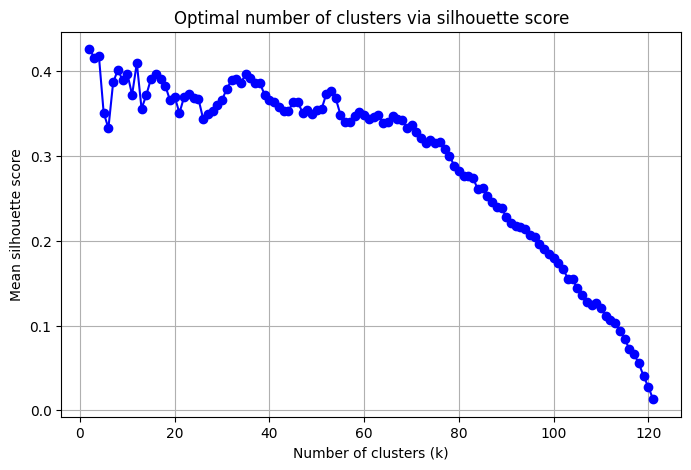

Optimal number of clusters: 2


In [ ]:
data_assets = data_return_variance.T  
max_clusters = 121  # Number of assets
silhouette_scores = []

# Loop to compute silhouette scores
for k in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(data_assets)
    score = silhouette_score(data_assets, labels)
    silhouette_scores.append(score)

# Plot silhouette scores
plt.figure(figsize=(8,5))
plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o', color='blue')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Mean silhouette score")
plt.title("Optimal number of clusters via silhouette score")
plt.grid(True)
plt.show()

# Apply KMeans with optimal clusters
optimal_k = np.argmax(silhouette_scores) + 2
print(f"Optimal number of clusters: {optimal_k}")
kmeans_opt = KMeans(n_clusters=optimal_k, random_state=42)
asset_labels = kmeans_opt.fit_predict(data_assets)
data_assets['cluster'] = asset_labels

# PCA 2D visualization (interactive)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(data_assets.drop('cluster', axis=1))
explained_var = pca.explained_variance_ratio_ * 100



import plotly.express as px
import plotly.io as pio
import pandas as pd

# Construire un DataFrame avec PCA + cluster + noms des actifs
pca_df = pd.DataFrame({
    "PCA1": pca_result[:,0],
    "PCA2": pca_result[:,1],
    "Cluster": asset_labels.astype(str),  # convertir en string pour légende discrète
    "Asset": data_assets.index
})

custom_colors = ["orange", "green"]
fig = px.scatter(
    pca_df,
    x="PCA1",
    y="PCA2",
    color="Cluster",  
    hover_data=["Asset"],  
    title="Interactive PCA Clusters of Assets",
    labels={
        "PCA1": f"PCA1 ({explained_var[0]:.2f}% variance)",
        "PCA2": f"PCA2 ({explained_var[1]:.2f}% variance)"
    },
    color_discrete_sequence=custom_colors  
)


fig.update_traces(marker=dict(size=8, opacity=0.8))
pio.show(fig)
